In [2]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Dense, Flatten, Conv2D, MaxPooling2D, BatchNormalization, Dropout, Reshape, Concatenate, LeakyReLU
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model

In [3]:
# Height and width refer to the size of the image
# Channels refers to the amount of color channels (red, green, blue)

image_dimensions = {'height':256, 'width':256, 'channels':3}

In [4]:
class Classifier:
    def __init__(self):
        self.model = None

    def fit(self, *args, **kwargs):
        return self.model.fit(*args, **kwargs)

    def predict(self, x):
        return self.model.predict(x)


In [5]:
class Meso4(Classifier):
    def __init__(self, learning_rate=0.001):
        super().__init__()
        self.model = self.init_model()
        self.model.compile(
            optimizer=Adam(learning_rate),
            loss="binary_crossentropy",
            metrics=["accuracy"]
        )

    def init_model(self):
        inp = Input(shape=(256,256,3))

        x = Conv2D(8, (3,3), padding="same", activation="relu")(inp)
        x = BatchNormalization()(x)
        x = MaxPooling2D(2)(x)

        x = Conv2D(8, (5,5), padding="same", activation="relu")(x)
        x = BatchNormalization()(x)
        x = MaxPooling2D(2)(x)

        x = Conv2D(16, (5,5), padding="same", activation="relu")(x)
        x = BatchNormalization()(x)
        x = MaxPooling2D(2)(x)

        x = Conv2D(16, (5,5), padding="same", activation="relu")(x)
        x = BatchNormalization()(x)
        x = MaxPooling2D(4)(x)

        x = Flatten()(x)
        x = Dropout(0.5)(x)
        x = Dense(16)(x)
        x = LeakyReLU(0.1)(x)
        x = Dropout(0.5)(x)

        out = Dense(1, activation="sigmoid")(x)

        return Model(inp, out)


In [6]:
train_gen = ImageDataGenerator(rescale=1./255)
test_gen  = ImageDataGenerator(rescale=1./255)

train_data = train_gen.flow_from_directory(
    "./data/train",
    target_size=(256,256),
    batch_size=1,
    class_mode="binary"
)

test_data = test_gen.flow_from_directory(
    "./data/test",
    target_size=(256,256),
    batch_size=1,
    class_mode="binary"
)


Found 104363 images belonging to 2 classes.
Found 10905 images belonging to 2 classes.


In [7]:
print(train_data.class_indices)


{'Fake': 0, 'Real': 1}


In [8]:

meso = Meso4()

history = meso.fit(
    train_data,
    epochs=1,
    validation_data=test_data
)
meso.model.save_weights("meso_trained.weights.h5")


104363/104363 ━━━━━━━━━━━━━━━━━━━━ 5400s 52ms/step - accuracy: 0.8154 - loss: 0.3973 - val_accuracy: 0.7464 - val_loss: 0.5292


In [8]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

def predict_image(image_path, model, threshold=0.5):
    # Load image
    img = load_img(image_path, target_size=(256, 256))
    img_array = img_to_array(img)
    img_array = img_array / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # Predict
    prob = model.predict(img_array)[0][0]

    # Decide label
    label = "REAL" if prob > threshold else "FAKE"

    # Display image
    plt.imshow(img)
    plt.title(f"{label} | Confidence: {prob:.2f}")
    plt.axis("off")
    plt.show()

    return label, prob


In [10]:
meso = Meso4()
meso.model.load_weights("meso_trained.weights.h5", skip_mismatch=True)


Found 10905 images belonging to 2 classes.
10905/10905 ━━━━━━━━━━━━━━━━━━━━ 249s 23ms/step


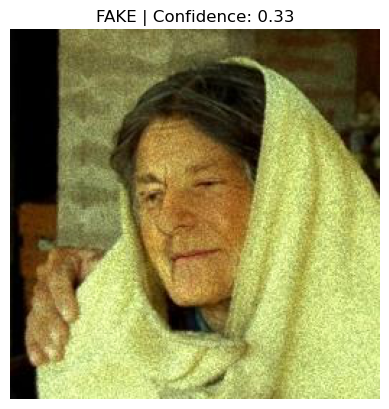

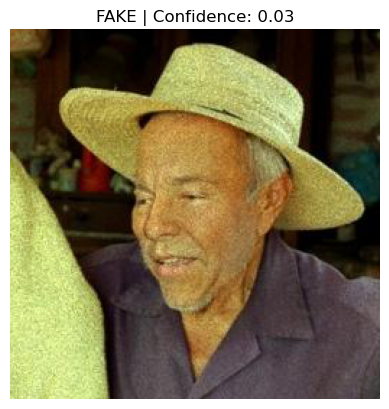

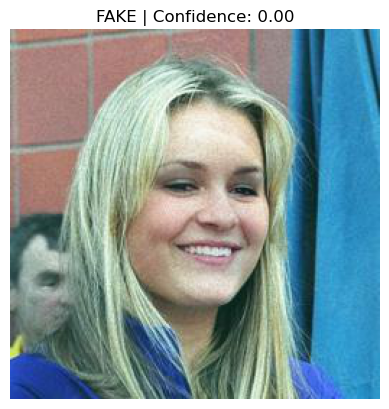

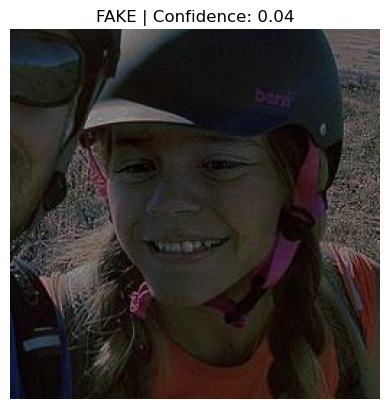

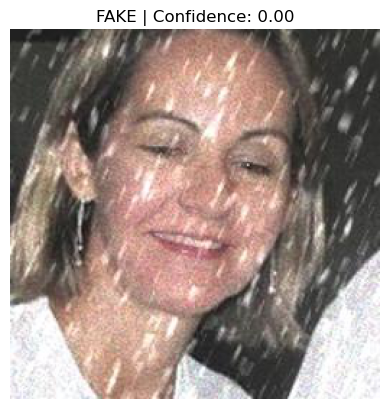

...

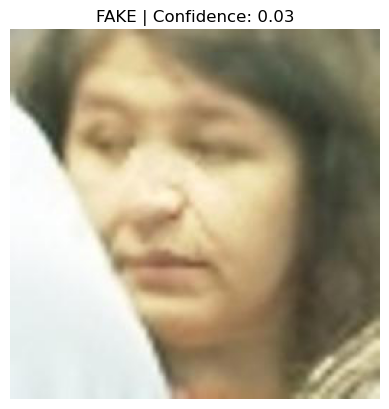

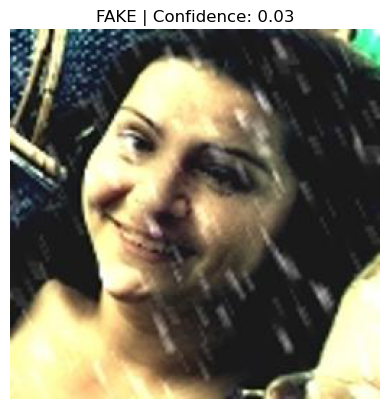

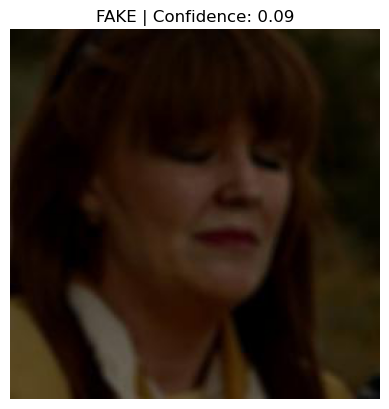

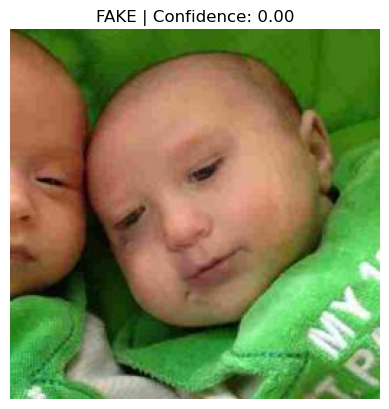

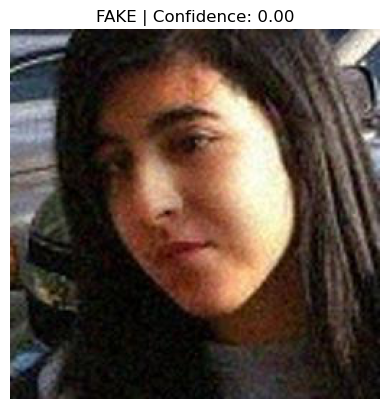

In [11]:
test_vis = ImageDataGenerator(rescale=1./255).flow_from_directory(
    "./data/test",
    target_size=(256,256),
    batch_size=1,
    class_mode="binary",
    shuffle=False
)

preds = meso.predict(test_vis)

inv_class = {v:k for k,v in test_vis.class_indices.items()}

for i in range(50):
    X, _ = next(test_vis)
    prob = preds[i][0]
    label = inv_class[int(prob > 0.5)]

    plt.imshow(np.squeeze(X))
    plt.title(f"{label.upper()} | Confidence: {prob:.2f}")
    plt.axis("off")
    plt.show()


In [1]:
image_path = r"C:\Users\MY PC\Desktop\deepfake\data\Test\Fake\real_0.jpg"  # change this
label, confidence = predict_image(image_path, meso.model)

print("Prediction:", label)
print("Confidence:", confidence)


NameError: name 'predict_image' is not defined